# Metadata Information Details

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

In [2]:
pd.set_option('display.max_rows', None)  
pd.set_option('display.max_columns', None)  
pd.set_option('display.width', None)  

In [3]:
df = pd.read_csv('googleplaystore.csv')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10841 non-null  object 
 1   Category        10841 non-null  object 
 2   Rating          9367 non-null   float64
 3   Reviews         10841 non-null  object 
 4   Size            10841 non-null  object 
 5   Installs        10841 non-null  object 
 6   Type            10840 non-null  object 
 7   Price           10841 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10841 non-null  object 
 10  Last Updated    10841 non-null  object 
 11  Current Ver     10833 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(1), object(12)
memory usage: 1.1+ MB


In [5]:
df.describe()

,Rating
count,9367.000000
mean,4.193338
std,0.537431
min,1.000000
25%,4.000000
50%,4.300000
75%,4.500000
max,19.000000


In [6]:
df.describe(include='object')

,App,Category,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
count,10841,10841,10841,10841,10841,10840,10841,10840,10841,10841,10833,10838
unique,9660,34,6002,462,22,3,93,6,120,1378,2832,33
top,ROBLOX,FAMILY,0,Varies with device,"1,000,000+",Free,0,Everyone,Tools,"August 3, 2018",Varies with device,4.1 and up
freq,9,1972,596,1695,1579,10039,10040,8714,842,326,1459,2451


In [7]:
df.shape

(10841, 13)

In [8]:
df.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


In [9]:
nama_kolom = df.columns.tolist()
print(nama_kolom)

['App', 'Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type', 'Price', 'Content Rating', 'Genres', 'Last Updated', 'Current Ver', 'Android Ver']


In [10]:
print(df.isnull().sum())

App                  0
Category             0
Rating            1474
Reviews              0
Size                 0
Installs             0
Type                 1
Price                0
Content Rating       1
Genres               0
Last Updated         0
Current Ver          8
Android Ver          3
dtype: int64


In [11]:
df.isnull().sum().sum()

np.int64(1487)

In [12]:
df.isnull().sum() / len(df) * 100

App                0.000000
Category           0.000000
Rating            13.596532
Reviews            0.000000
Size               0.000000
Installs           0.000000
Type               0.009224
Price              0.000000
Content Rating     0.009224
Genres             0.000000
Last Updated       0.000000
Current Ver        0.073794
Android Ver        0.027673
dtype: float64

In [13]:
df_missing = df[df.isnull().any(axis=1)]
display(df_missing)

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
15,Learn To Draw Kawaii Characters,ART_AND_DESIGN,3.2,55,2.7M,"5,000+",Free,0,Everyone,Art & Design,"June 6, 2018",NaN,4.2 and up
23,Mcqueen Coloring pages,ART_AND_DESIGN,NaN,61,7.0M,"100,000+",Free,0,Everyone,Art & Design;Action & Adventure,"March 7, 2018",1.0.0,4.1 and up
113,Wrinkles and rejuvenation,BEAUTY,NaN,182,5.7M,"100,000+",Free,0,Everyone 10+,Beauty,"September 20, 2017",8.0,3.0 and up
123,Manicure - nail design,BEAUTY,NaN,119,3.7M,"50,000+",Free,0,Everyone,Beauty,"July 23, 2018",1.3,4.1 and up
126,Skin Care and Natural Beauty,BEAUTY,NaN,654,7.4M,"100,000+",Free,0,Teen,Beauty,"July 17, 2018",1.15,4.1 and up
129,"Secrets of beauty, youth and health",BEAUTY,NaN,77,2.9M,"10,000+",Free,0,Mature 17+,Beauty,"August 8, 2017",2.0,2.3 and up
130,Recipes and tips for losing weight,BEAUTY,NaN,35,3.1M,"10,000+",Free,0,Everyone 10+,Beauty,"December 11, 2017",2.0,3.0 and up
134,"Lady adviser (beauty, health)",BEAUTY,NaN,30,9.9M,"10,000+",Free,0,Mature 17+,Beauty,"January 24, 2018",3.0,3.0 and up
163,Anonymous caller detection,BOOKS_AND_REFERENCE,NaN,161,2.7M,"10,000+",Free,0,Everyone,Books & Reference,"July 13, 2018",1.0,2.3 and up
180,SH-02J Owner's Manual (Android 8.0),BOOKS_AND_REFERENCE,NaN,2,7.2M,"50,000+",Free,0,Everyone,Books & Reference,"June 15, 2018",3.0,6.0 and up


In [14]:
jumlah_duplikat = df.duplicated(keep='first').sum()
print(jumlah_duplikat)

483


In [15]:
df_duplikat = df[df.duplicated(keep=False)]
display(df_duplikat)

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
164,Ebook Reader,BOOKS_AND_REFERENCE,4.1,85842,37M,"5,000,000+",Free,0,Everyone,Books & Reference,"June 25, 2018",5.0.6,4.0 and up
192,Docs To Go™ Free Office Suite,BUSINESS,4.1,217730,Varies with device,"50,000,000+",Free,0,Everyone,Business,"April 2, 2018",Varies with device,Varies with device
193,Google My Business,BUSINESS,4.4,70991,Varies with device,"5,000,000+",Free,0,Everyone,Business,"July 24, 2018",2.19.0.204537701,4.4 and up
204,Box,BUSINESS,4.2,159872,Varies with device,"10,000,000+",Free,0,Everyone,Business,"July 31, 2018",Varies with device,Varies with device
213,ZOOM Cloud Meetings,BUSINESS,4.4,31614,37M,"10,000,000+",Free,0,Everyone,Business,"July 20, 2018",4.1.28165.0716,4.0 and up
222,Quick PDF Scanner + OCR FREE,BUSINESS,4.2,80805,Varies with device,"5,000,000+",Free,0,Everyone,Business,"February 26, 2018",Varies with device,4.0.3 and up
228,SignEasy | Sign and Fill PDF and other Documents,BUSINESS,4.3,8978,Varies with device,"1,000,000+",Free,0,Everyone,Business,"July 25, 2018",Varies with device,Varies with device
229,Quick PDF Scanner + OCR FREE,BUSINESS,4.2,80805,Varies with device,"5,000,000+",Free,0,Everyone,Business,"February 26, 2018",Varies with device,4.0.3 and up
230,Genius Scan - PDF Scanner,BUSINESS,4.4,42492,Varies with device,"1,000,000+",Free,0,Everyone,Business,"July 11, 2018",Varies with device,Varies with device
231,Tiny Scanner - PDF Scanner App,BUSINESS,4.7,286897,39M,"10,000,000+",Free,0,Everyone,Business,"May 30, 2017",1.2.6,3.0 and up


In [16]:
print("Total rows:", len(df))
print("Unique rows:", len(df.drop_duplicates()))
print("All duplicated rows:", df.duplicated(keep=False).sum())
print("Extra duplicated rows:", df.duplicated().sum())

Total rows: 10841
Unique rows: 10358
All duplicated rows: 893
Extra duplicated rows: 483


In [17]:
# 1. Cek total baris
print("Total entri:", len(df))

# 2. Cek jumlah duplikat total
print("Jumlah baris duplikat:", df.duplicated().sum())

# 3. Cek jumlah duplikat di kolom 'App'
print("Jumlah duplikat di kolom App:", df['App'].duplicated().sum())

# 4. Cek jumlah nilai unik di kolom 'App'
print("Jumlah aplikasi unik:", df['App'].nunique())

# 5. Cek nilai kosong di kolom 'App'
print("Jumlah nilai kosong di kolom App:", df['App'].isna().sum())

Total entri: 10841
Jumlah baris duplikat: 483
Jumlah duplikat di kolom App: 1181
Jumlah aplikasi unik: 9660
Jumlah nilai kosong di kolom App: 0


# Data Preprocessing

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10841 non-null  object 
 1   Category        10841 non-null  object 
 2   Rating          9367 non-null   float64
 3   Reviews         10841 non-null  object 
 4   Size            10841 non-null  object 
 5   Installs        10841 non-null  object 
 6   Type            10840 non-null  object 
 7   Price           10841 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10841 non-null  object 
 10  Last Updated    10841 non-null  object 
 11  Current Ver     10833 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(1), object(12)
memory usage: 1.1+ MB


## Ubah Tipe Data

### 1. Pastikan Format data untuk Rating adalah float

In [19]:
df['Rating'] = pd.to_numeric(df['Rating'])

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10841 non-null  object 
 1   Category        10841 non-null  object 
 2   Rating          9367 non-null   float64
 3   Reviews         10841 non-null  object 
 4   Size            10841 non-null  object 
 5   Installs        10841 non-null  object 
 6   Type            10840 non-null  object 
 7   Price           10841 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10841 non-null  object 
 10  Last Updated    10841 non-null  object 
 11  Current Ver     10833 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(1), object(12)
memory usage: 1.1+ MB


### 2. Tipe Data Reviews dari Object menjadi Integer

In [21]:
# Temukan indeks baris yang bermasalah
idx = df.index[df['App'] == 'Life Made WI-Fi Touchscreen Photo Frame'].tolist()[0]

# Ambil data baris sebagai list
row_data = df.loc[idx].tolist()

# Kolom yang diharapkan
columns = ['App']

# Geser data ke kanan dan tambahkan 'Category' dengan nilai 'Unknown'
corrected_data = ['Life Made WI-Fi Touchscreen Photo Frame', 'Unknown'] + row_data[1:-1]

# Pastikan panjang data sesuai dengan jumlah kolom
if len(corrected_data) < len(columns):
    corrected_data.extend([None] * (len(columns) - len(corrected_data)))

# Perbarui baris di DataFrame
df.loc[idx] = corrected_data

# Verifikasi
print("Data setelah diperbaiki:")
print(df.loc[idx])

Data setelah diperbaiki:
App               Life Made WI-Fi Touchscreen Photo Frame
Category                                          Unknown
Rating                                                1.9
Reviews                                              19.0
Size                                                 3.0M
Installs                                           1,000+
Type                                                 Free
Price                                                   0
Content Rating                                   Everyone
Genres                                                NaN
Last Updated                            February 11, 2018
Current Ver                                        1.0.19
Android Ver                                    4.0 and up
Name: 10472, dtype: object


C:\Users\ASUS\AppData\Local\Temp\ipykernel_20780\3082713040.py:18: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.9' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[idx] = corrected_data


In [22]:
df['Reviews'] = df['Reviews'].astype(int)

In [23]:
df.info()   

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   App             10841 non-null  object
 1   Category        10841 non-null  object
 2   Rating          9367 non-null   object
 3   Reviews         10841 non-null  int64 
 4   Size            10841 non-null  object
 5   Installs        10841 non-null  object
 6   Type            10840 non-null  object
 7   Price           10841 non-null  object
 8   Content Rating  10841 non-null  object
 9   Genres          10840 non-null  object
 10  Last Updated    10841 non-null  object
 11  Current Ver     10833 non-null  object
 12  Android Ver     10839 non-null  object
dtypes: int64(1), object(12)
memory usage: 1.1+ MB


### 3. Tipe Data Size dari Object menjadi float64

In [24]:
# Ubah nama kolom Size 
df = df.rename(columns={'Size': 'Size (M)'})

In [25]:
def clean_size(size):
    if pd.isna(size) or str(size).lower() == 'varies with device':
        return None  
    size_str = str(size).replace('M', '').replace('k', 'e-3') 
    try:
        return float(size_str)
    except ValueError:
        return None

df['Size (M)'] = df['Size (M)'].apply(clean_size)

df['Size (M)'] = df['Size (M)'].fillna(df['Size (M)'].median())

In [26]:
df['Size (M)'] = df['Size (M)'].astype(float)

### 4. Ubah tipe data Installs dari Object menjadi Integer

In [27]:
# Konversi kolom Installs (misalnya "10,000+" ke 10000)
df['Installs'] = df['Installs'].str.replace('[\+,]', '', regex=True) 
df['Installs'] = pd.to_numeric(df['Installs'], errors='coerce').fillna(0)  

<>:2: SyntaxWarning: invalid escape sequence '\+'
<>:2: SyntaxWarning: invalid escape sequence '\+'
C:\Users\ASUS\AppData\Local\Temp\ipykernel_20780\2524618794.py:2: SyntaxWarning: invalid escape sequence '\+'
  df['Installs'] = df['Installs'].str.replace('[\+,]', '', regex=True)


In [28]:
# Konversi ke tipe integer (int64)
df['Installs'] = df['Installs'].astype('int64')

### 5. Ubah tipe data Price dari Object menjadi float64

In [29]:
# Bersihkan kolom Price: hapus simbol "$" dan konversi ke float
df['Price'] = df['Price'].replace('[\$,]', '', regex=True)  
df['Price'] = pd.to_numeric(df['Price'], errors='coerce')  

print("Tipe data kolom Price:", df['Price'].dtype)

Tipe data kolom Price: float64


<>:2: SyntaxWarning: invalid escape sequence '\$'
<>:2: SyntaxWarning: invalid escape sequence '\$'
C:\Users\ASUS\AppData\Local\Temp\ipykernel_20780\1313369473.py:2: SyntaxWarning: invalid escape sequence '\$'
  df['Price'] = df['Price'].replace('[\$,]', '', regex=True)


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10841 non-null  object 
 1   Category        10841 non-null  object 
 2   Rating          9367 non-null   object 
 3   Reviews         10841 non-null  int64  
 4   Size (M)        10841 non-null  float64
 5   Installs        10841 non-null  int64  
 6   Type            10840 non-null  object 
 7   Price           10841 non-null  float64
 8   Content Rating  10841 non-null  object 
 9   Genres          10840 non-null  object 
 10  Last Updated    10841 non-null  object 
 11  Current Ver     10833 non-null  object 
 12  Android Ver     10839 non-null  object 
dtypes: float64(2), int64(2), object(9)
memory usage: 1.1+ MB


### 6. Ubah tipe data Last Updated dari Object menjadi Date Time

In [31]:
df['Last Updated'] = pd.to_datetime(df['Last Updated'], format='%B %d, %Y')


In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   App             10841 non-null  object        
 1   Category        10841 non-null  object        
 2   Rating          9367 non-null   object        
 3   Reviews         10841 non-null  int64         
 4   Size (M)        10841 non-null  float64       
 5   Installs        10841 non-null  int64         
 6   Type            10840 non-null  object        
 7   Price           10841 non-null  float64       
 8   Content Rating  10841 non-null  object        
 9   Genres          10840 non-null  object        
 10  Last Updated    10841 non-null  datetime64[ns]
 11  Current Ver     10833 non-null  object        
 12  Android Ver     10839 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(2), object(8)
memory usage: 1.1+ MB


## Cek and Drop Duplicate 

In [33]:
df = df.drop_duplicates(subset=['App'])

In [34]:
df = df.drop_duplicates(keep='first')

In [35]:
display(df)

,App,Category,Rating,Reviews,Size (M),Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19.0000,10000,Free,0.00,Everyone,Art & Design,2018-01-07,1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14.0000,500000,Free,0.00,Everyone,Art & Design;Pretend Play,2018-01-15,2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7000,5000000,Free,0.00,Everyone,Art & Design,2018-08-01,1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25.0000,50000000,Free,0.00,Teen,Art & Design,2018-06-08,Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8000,100000,Free,0.00,Everyone,Art & Design;Creativity,2018-06-20,1.1,4.4 and up
5,Paper flowers instructions,ART_AND_DESIGN,4.4,167,5.6000,50000,Free,0.00,Everyone,Art & Design,2017-03-26,1.0,2.3 and up
6,Smoke Effect Photo Maker - Smoke Editor,ART_AND_DESIGN,3.8,178,19.0000,50000,Free,0.00,Everyone,Art & Design,2018-04-26,1.1,4.0.3 and up
7,Infinite Painter,ART_AND_DESIGN,4.1,36815,29.0000,1000000,Free,0.00,Everyone,Art & Design,2018-06-14,6.1.61.1,4.2 and up
8,Garden Coloring Book,ART_AND_DESIGN,4.4,13791,33.0000,1000000,Free,0.00,Everyone,Art & Design,2017-09-20,2.9.2,3.0 and up
9,Kids Paint Free - Drawing Fun,ART_AND_DESIGN,4.7,121,3.1000,10000,Free,0.00,Everyone,Art & Design;Creativity,2018-07-03,2.8,4.0.3 and up


In [36]:
jumlah_duplikat = df.duplicated(keep='first').sum()
print(jumlah_duplikat)

0


In [37]:
print("Total entri setelah hapus duplikat:", len(df))

Total entri setelah hapus duplikat: 9660


## Cek Missing Value

In [38]:
print(df.isnull().sum())

App                  0
Category             0
Rating            1463
Reviews              0
Size (M)             0
Installs             0
Type                 1
Price                0
Content Rating       0
Genres               1
Last Updated         0
Current Ver          8
Android Ver          2
dtype: int64


### 1. Missing Value Kolom Rating 

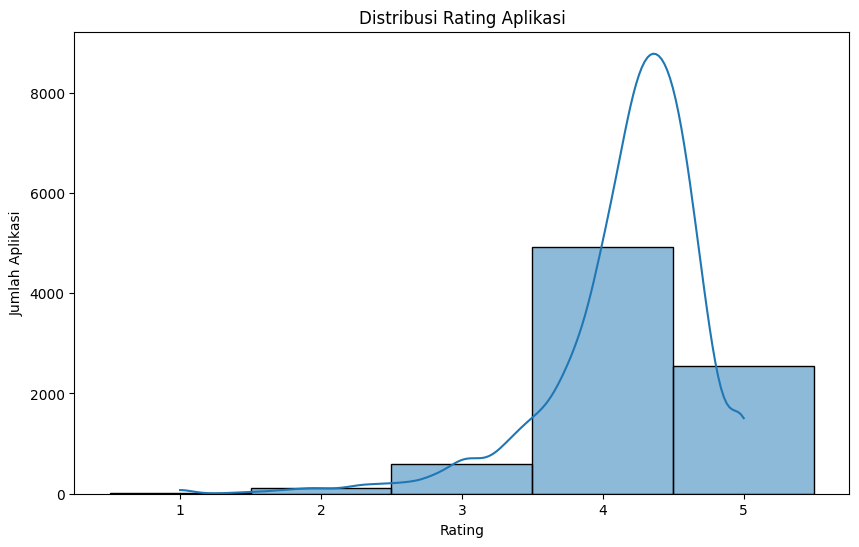

In [39]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Rating', bins=20, kde=True)  
plt.title('Distribusi Rating Aplikasi')
plt.xlabel('Rating')
plt.ylabel('Jumlah Aplikasi')
plt.show()

In [40]:
df

,App,Category,Rating,Reviews,Size (M),Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19.0000,10000,Free,0.00,Everyone,Art & Design,2018-01-07,1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14.0000,500000,Free,0.00,Everyone,Art & Design;Pretend Play,2018-01-15,2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7000,5000000,Free,0.00,Everyone,Art & Design,2018-08-01,1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25.0000,50000000,Free,0.00,Teen,Art & Design,2018-06-08,Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8000,100000,Free,0.00,Everyone,Art & Design;Creativity,2018-06-20,1.1,4.4 and up
5,Paper flowers instructions,ART_AND_DESIGN,4.4,167,5.6000,50000,Free,0.00,Everyone,Art & Design,2017-03-26,1.0,2.3 and up
6,Smoke Effect Photo Maker - Smoke Editor,ART_AND_DESIGN,3.8,178,19.0000,50000,Free,0.00,Everyone,Art & Design,2018-04-26,1.1,4.0.3 and up
7,Infinite Painter,ART_AND_DESIGN,4.1,36815,29.0000,1000000,Free,0.00,Everyone,Art & Design,2018-06-14,6.1.61.1,4.2 and up
8,Garden Coloring Book,ART_AND_DESIGN,4.4,13791,33.0000,1000000,Free,0.00,Everyone,Art & Design,2017-09-20,2.9.2,3.0 and up
9,Kids Paint Free - Drawing Fun,ART_AND_DESIGN,4.7,121,3.1000,10000,Free,0.00,Everyone,Art & Design;Creativity,2018-07-03,2.8,4.0.3 and up


In [41]:
df['Rating'] = pd.to_numeric(df['Rating'])

In [42]:
df['Rating'] = df['Rating'].replace('', pd.NA)

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9660 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   App             9660 non-null   object        
 1   Category        9660 non-null   object        
 2   Rating          8197 non-null   float64       
 3   Reviews         9660 non-null   int64         
 4   Size (M)        9660 non-null   float64       
 5   Installs        9660 non-null   int64         
 6   Type            9659 non-null   object        
 7   Price           9660 non-null   float64       
 8   Content Rating  9660 non-null   object        
 9   Genres          9659 non-null   object        
 10  Last Updated    9660 non-null   datetime64[ns]
 11  Current Ver     9652 non-null   object        
 12  Android Ver     9658 non-null   object        
dtypes: datetime64[ns](1), float64(3), int64(2), object(7)
memory usage: 1.0+ MB


In [44]:
# Mengisi missing value dengan median per kategori
df['Rating'] = df.groupby('Category')['Rating'].transform(lambda x: x.fillna(x.median()))

In [45]:
print(df.isnull().sum())

App               0
Category          0
Rating            0
Reviews           0
Size (M)          0
Installs          0
Type              1
Price             0
Content Rating    0
Genres            1
Last Updated      0
Current Ver       8
Android Ver       2
dtype: int64


### 2. Missing Value pada Kolom Type

In [46]:
# Menghitung distribusi nilai pada kolom Type
type_distribution = df['Type'].value_counts(dropna=False)  
type_percentage = df['Type'].value_counts(normalize=True, dropna=False) * 100

print("Distribusi nilai pada kolom Type:")
print(type_distribution)
print("\nPersentase distribusi nilai pada kolom Type:")
print(type_percentage)

Distribusi nilai pada kolom Type:
Type
Free    8903
Paid     756
NaN        1
Name: count, dtype: int64

Persentase distribusi nilai pada kolom Type:
Type
Free    92.163561
Paid     7.826087
NaN      0.010352
Name: proportion, dtype: float64


In [47]:
# Mengganti nilai kosong atau "" dengan NaN
df['Type'] = df['Type'].replace('', pd.NA)

# Menemukan baris dengan NaN di kolom Type
missing_type_rows = df[df['Type'].isna()]

# Menampilkan baris dengan missing value
print("Baris dengan missing value di kolom Type (NaN):")
display(missing_type_rows)

Baris dengan missing value di kolom Type (NaN):


,App,Category,Rating,Reviews,Size (M),Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
9148,Command & Conquer: Rivals,FAMILY,4.3,0,13.0,0,NaN,0.0,Everyone 10+,Strategy,2018-06-28,Varies with device,Varies with device


In [48]:
# # Opsi 1 = Mengisi dengan Modus ("Free")

# # Mengganti nilai kosong atau "" dengan NaN
# df['Type'] = df['Type'].replace('', pd.NA)

# # Mengganti "0" dengan NaN (karena tidak valid)
# df['Type'] = df['Type'].replace('0', pd.NA)

# # Mengisi missing value dengan modus ("Free")
# type_mode = df['Type'].mode()[0]  # Harusnya "Free" berdasarkan distribusi
# df['Type'] = df['Type'].fillna(type_mode)

In [49]:
# Opsi 2 Mengisi Berdasarkan Kolom Price (Alternatif)

# Mengganti nilai kosong atau "" dengan NaN
df['Type'] = df['Type'].replace('', pd.NA)

# Mengganti "0" dengan NaN (karena tidak valid)
df['Type'] = df['Type'].replace('0', pd.NA)

# Mengisi Type berdasarkan Price
df.loc[(df['Type'].isna()) & (df['Price'] == 0), 'Type'] = 'Free'
df.loc[(df['Type'].isna()) & (df['Price'] > 0), 'Type'] = 'Paid'

In [50]:
print(df.isnull().sum())

App               0
Category          0
Rating            0
Reviews           0
Size (M)          0
Installs          0
Type              0
Price             0
Content Rating    0
Genres            1
Last Updated      0
Current Ver       8
Android Ver       2
dtype: int64


### 3. Missing Value pada Kolom Genres

In [51]:
# Menemukan baris dengan missing value di kolom Price
missing_price_rows = df[df['Genres'].isna()]

# Menampilkan baris dengan missing value
print("Baris dengan missing value di kolom Genres:")
display(missing_price_rows[['App', 'Category', 'Genres']])

Baris dengan missing value di kolom Genres:


,App,Category,Genres
10472,Life Made WI-Fi Touchscreen Photo Frame,Unknown,NaN


In [52]:
df['Genres'] = df['Genres'].fillna('Unknown')

In [53]:
print(df.isnull().sum())

App               0
Category          0
Rating            0
Reviews           0
Size (M)          0
Installs          0
Type              0
Price             0
Content Rating    0
Genres            0
Last Updated      0
Current Ver       8
Android Ver       2
dtype: int64


### 4. Missing Value pada Kolom Current Ver

In [54]:
# Menemukan baris dengan missing value
missing_curr_ver_rows = df[df['Current Ver'].isna()]
print("\nBaris dengan missing value di kolom Content Rating:")
display(missing_curr_ver_rows[['App', 'Category', 'Current Ver', 'Last Updated']])


Baris dengan missing value di kolom Content Rating:


,App,Category,Current Ver,Last Updated
15,Learn To Draw Kawaii Characters,ART_AND_DESIGN,NaN,2018-06-06
1553,Market Update Helper,LIBRARIES_AND_DEMO,NaN,2013-02-12
6322,Virtual DJ Sound Mixer,TOOLS,NaN,2017-05-10
6803,BT Master,FAMILY,NaN,2016-11-06
7333,Dots puzzle,FAMILY,NaN,2018-04-18
7407,Calculate My IQ,FAMILY,NaN,2017-04-03
7730,UFO-CQ,TOOLS,NaN,2016-07-04
10342,La Fe de Jesus,BOOKS_AND_REFERENCE,NaN,2017-01-31


In [55]:
# Mengisi missing value dengan "Unknown"
df['Current Ver'] = df['Current Ver'].fillna('Unknown')

In [56]:
print("\nBaris setelah imputasi:")
display(df.loc[df.index.isin(missing_curr_ver_rows.index), ['App', 'Current Ver']])


Baris setelah imputasi:


,App,Current Ver
15,Learn To Draw Kawaii Characters,Unknown
1553,Market Update Helper,Unknown
6322,Virtual DJ Sound Mixer,Unknown
6803,BT Master,Unknown
7333,Dots puzzle,Unknown
7407,Calculate My IQ,Unknown
7730,UFO-CQ,Unknown
10342,La Fe de Jesus,Unknown


In [57]:
print(df.isnull().sum())

App               0
Category          0
Rating            0
Reviews           0
Size (M)          0
Installs          0
Type              0
Price             0
Content Rating    0
Genres            0
Last Updated      0
Current Ver       0
Android Ver       2
dtype: int64


### 5. Missing Value pada Kolom Android Ver

In [58]:
# Menemukan baris dengan missing value
missing_ver_rows = df[df['Android Ver'].isna()]
print("\nBaris dengan missing value di kolom Android Ver:")
display(missing_ver_rows[['App', 'Android Ver']])


Baris dengan missing value di kolom Android Ver:


,App,Android Ver
4453,[substratum] Vacuum: P,NaN
4490,Pi Dark [substratum],NaN


In [59]:
# Mengisi missing value dengan "Unknown"
df['Android Ver'] = df['Android Ver'].fillna('Unknown')

In [60]:
print("\nBaris setelah imputasi:")
display(df.loc[df.index.isin(missing_ver_rows.index), ['App', 'Android Ver']])


Baris setelah imputasi:


,App,Android Ver
4453,[substratum] Vacuum: P,Unknown
4490,Pi Dark [substratum],Unknown


In [61]:
print(df.isnull().sum())

App               0
Category          0
Rating            0
Reviews           0
Size (M)          0
Installs          0
Type              0
Price             0
Content Rating    0
Genres            0
Last Updated      0
Current Ver       0
Android Ver       0
dtype: int64


In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9660 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   App             9660 non-null   object        
 1   Category        9660 non-null   object        
 2   Rating          9660 non-null   float64       
 3   Reviews         9660 non-null   int64         
 4   Size (M)        9660 non-null   float64       
 5   Installs        9660 non-null   int64         
 6   Type            9660 non-null   object        
 7   Price           9660 non-null   float64       
 8   Content Rating  9660 non-null   object        
 9   Genres          9660 non-null   object        
 10  Last Updated    9660 non-null   datetime64[ns]
 11  Current Ver     9660 non-null   object        
 12  Android Ver     9660 non-null   object        
dtypes: datetime64[ns](1), float64(3), int64(2), object(7)
memory usage: 1.0+ MB


## Deteksi Outlier

In [63]:
numeric_cols = ['Rating', 'Reviews', 'Size (M)', 'Installs', 'Price']

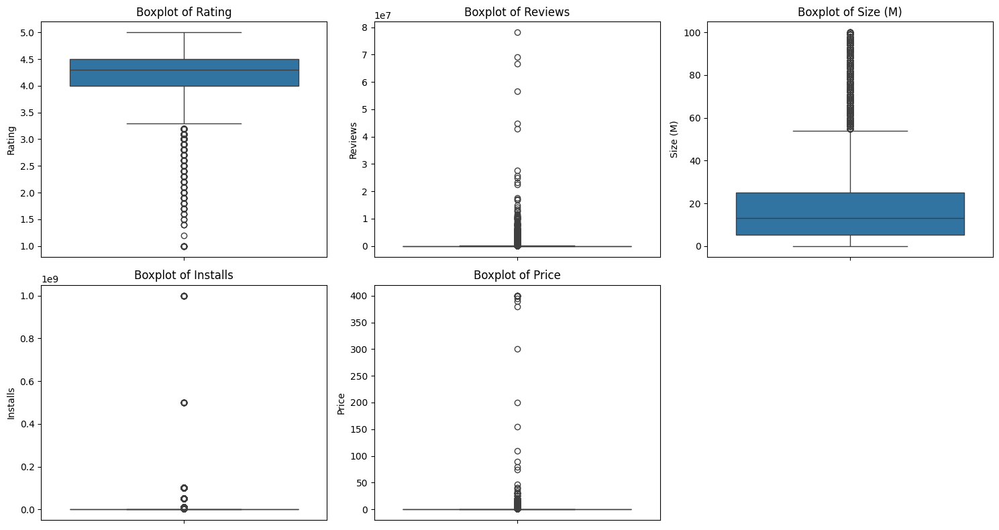

In [64]:
# Membuat boxplot untuk setiap kolom numerik
plt.figure(figsize=(15, 8))
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(2, 3, i) 
    sns.boxplot(y=df[col])  
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()

plt.show()

In [65]:
print("Jumlah data dengan Rating > 5:", len(df[df['Rating'] > 5]))
print("Data dengan Rating > 5:\n", df[df['Rating'] > 5])

Jumlah data dengan Rating > 5: 0
Data dengan Rating > 5:
 Empty DataFrame
Columns: [App, Category, Rating, Reviews, Size (M), Installs, Type, Price, Content Rating, Genres, Last Updated, Current Ver, Android Ver]
Index: []


### Histogram

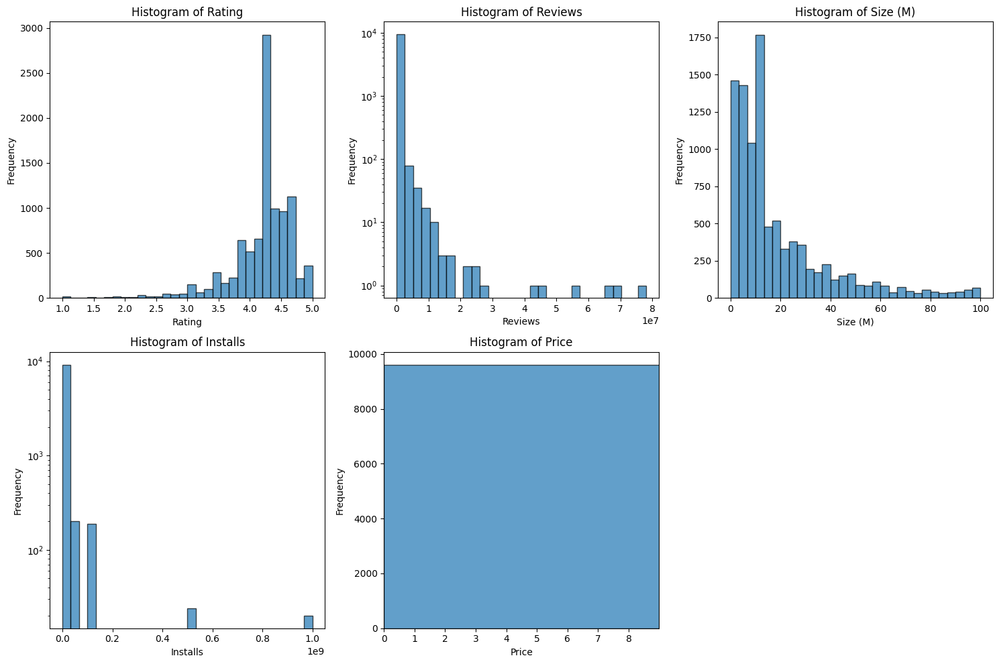

In [66]:
plt.figure(figsize=(15, 10))

for i, col in enumerate(numeric_cols, 1):
    plt.subplot(2, 3, i) 
    plt.hist(df[col], bins=30, edgecolor='black', alpha=0.7)  
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    
    # Menyesuaikan skala sumbu x untuk kolom tertentu jika perlu
    if col == 'Reviews' or col == 'Installs':
        plt.yscale('log')  
    elif col == 'Price':
        plt.xlim(0, df[col].quantile(0.99))  

plt.tight_layout()
plt.show()

### Metode IQR for Outlier

In [67]:
# Fungsi untuk menghitung batas IQR dan mendeteksi outlier
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)  
    Q3 = df[column].quantile(0.75)  
    IQR = Q3 - Q1                   
    lower_bound = Q1 - 1.5 * IQR  
    upper_bound = Q3 + 1.5 * IQR  
    
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)][column]
    
    return lower_bound, upper_bound, outliers

In [68]:
# Menyimpan hasil batas dan outlier
outlier_info = {}
for col in numeric_cols:
    lower, upper, outliers = detect_outliers_iqr(df, col)
    outlier_info[col] = {
        'Lower Bound': lower,
        'Upper Bound': upper,
        'Outliers Count': len(outliers),
        'Outliers': outliers.tolist()[:5]  
    }

In [69]:
# Tampilkan batas bawah dan atas serta informasi outlier
for col, info in outlier_info.items():
    print(f"\nKolom: {col}")
    print(f"Batas Bawah: {info['Lower Bound']:.2f}")
    print(f"Batas Atas: {info['Upper Bound']:.2f}")
    print(f"Jumlah Outlier: {info['Outliers Count']}")
    print(f"Contoh Outlier (5 pertama): {info['Outliers']}")


Kolom: Rating
Batas Bawah: 3.25
Batas Atas: 5.25
Jumlah Outlier: 493
Contoh Outlier (5 pertama): [3.2, 3.2, 3.1, 3.2, 3.2]

Kolom: Reviews
Batas Bawah: -44028.50
Batas Atas: 73447.50
Jumlah Outlier: 1656
Contoh Outlier (5 pertama): [87510, 215644, 194216, 224399, 295221]

Kolom: Size (M)
Batas Bawah: -24.25
Batas Atas: 54.55
Jumlah Outlier: 762
Contoh Outlier (5 pertama): [56.0, 57.0, 57.0, 73.0, 55.0]

Kolom: Installs
Batas Bawah: -1497500.00
Batas Atas: 2498500.00
Jumlah Outlier: 1978
Contoh Outlier (5 pertama): [5000000, 50000000, 10000000, 5000000, 10000000]

Kolom: Price
Batas Bawah: 0.00
Batas Atas: 0.00
Jumlah Outlier: 756
Contoh Outlier (5 pertama): [4.99, 4.99, 3.99, 3.99, 6.99]


### Histogram

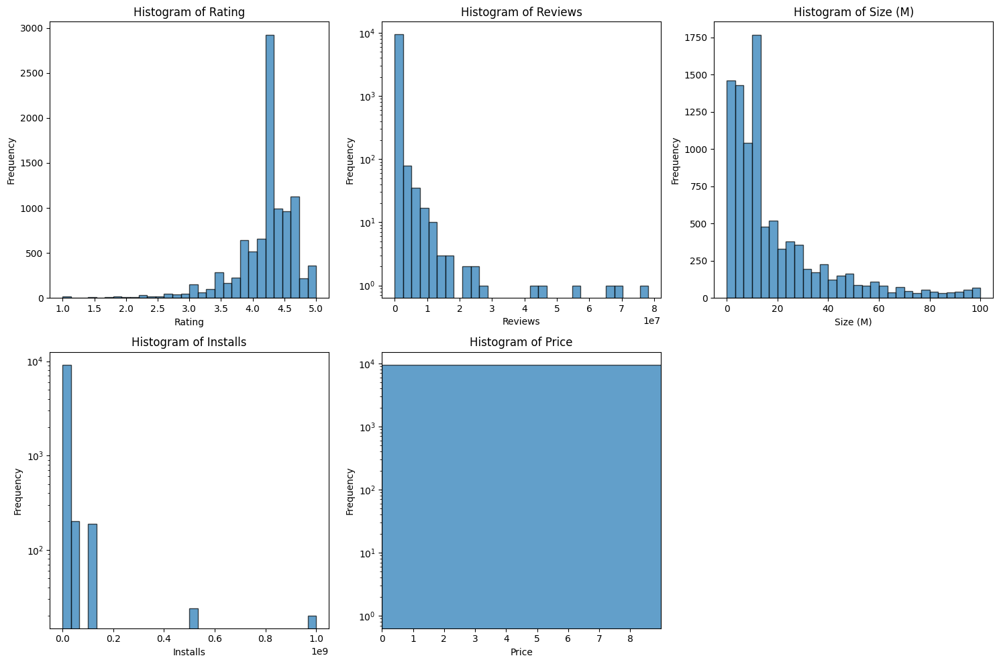

In [70]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Pilih kolom numerik
numeric_cols = ['Rating', 'Reviews', 'Size (M)', 'Installs', 'Price']

# Membuat figure
plt.figure(figsize=(15, 10))

# Loop untuk membuat histogram
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(2, 3, i)
    plt.hist(df[col], bins=30, edgecolor='black', alpha=0.7)
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    
    # Gunakan skala log untuk sumbu y pada kolom tertentu
    if col in ['Reviews', 'Installs', 'Price']:
        plt.yscale('log')  # Skala logaritmik untuk sumbu y
    
    # Batasi sumbu x untuk Price agar fokus pada nilai kecil
    if col == 'Price':
        plt.xlim(0, df['Price'].quantile(0.99))  # Batasi hingga kuartil 99%

plt.tight_layout()
plt.show()